In [1]:
import numpy as np
from IPython.display import Audio
from scipy.io.wavfile import read
import math
from scipy import signal
import scipy
import matplotlib.pyplot as plt
import matplotlib.colors as colors

In [2]:
def findClosest(array, value):
    idx = (np.abs(array - value)).argmin()
    return idx
def plotSTFTSpec(x, fs = 44100, getBins = False):
    freqs, times, stft_filt = scipy.signal.stft(x, fs=fs, padded=False, nperseg = 2048)
    plt.figure()
    plt.pcolormesh(times, freqs, 20*np.log10(np.abs(stft_filt)/np.max(np.abs(stft_filt))))
    plt.title("STFT")
    plt.xlabel("Time")
    plt.ylabel("Frequency")
    if getBins:
        return freqs, times, stft_filt
#====================================================================
def FIR_Filter(x, h, plot = False, fs = 44100):
    fir_length = len(x) + (len(h) - 1)
    preFilt = np.zeros(len(h))
    new_x = np.concatenate((preFilt, x))
    new_x = np.concatenate((new_x, preFilt[:-1]))
    impulse_start = 0
    impulse_end = len(h)
    for i in range(fir_length):
        flip = np.flip(h)
        multiples = new_x[impulse_start:impulse_end] * flip
        y = sum(multiples)
        if i < len(x):
            new_x[i] = y
        else:
            np.append(new_x, y)
        #print(y,i)
        impulse_start += 1
        impulse_end += 1
    result = new_x[len(h):]
    if plot:
        plotSTFTSpec(result, fs)
    return result
#====================================================================
def averagingImpulse(order, filter_type = 'Lowpass'):
    ones = np.ones(order)
    weighted = ones / order
    if filter_type == 'Lowpass':
        return weighted
    elif filter_type == 'Highpass':
        for i in range(order):
            weighted[i] *= (-1 ** i)
        return weighted

#====================================================================
def lowpassFilter(x, cutoff = 1500, order = 20, fs = 44100, plot = False):
    if order % 2 != 0:
        order +=1
    omHat = 2*np.pi*cutoff / fs
    nn = np.arange(0,order)
    centered = nn - order/2
    hn = np.sin(omHat*centered)/(np.pi*centered)
    hn[np.where(centered==0)] = omHat / np.pi
    
    return FIR_Filter(x, hn, plot = plot, fs = fs)
#====================================================================
def nullFilter(x, frequency = 1000, fs = 44100):
    bk = [1, -2*np.cos(2*np.pi*frequency/fs), 1]
    return FIR_Filter(x, bk, True, fs)
    

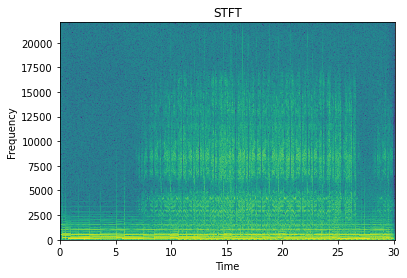

In [3]:
(fs, x) = read("../../AudioTech2/uploaded_audio/Radiohead_track3.wav")
Audio(x,rate=fs)
plotSTFTSpec(x,fs)

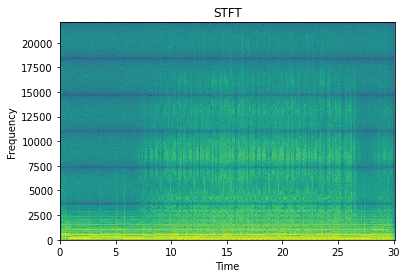

In [4]:
hn = [1/12, 1/12, 1/12, 1/12, 1/12, 1/12, 1/12, 1/12, 1/12, 1/12, 1/12, 1/12]
filtered = FIR_Filter(x, hn, True, fs)
Audio(filtered,rate=fs)

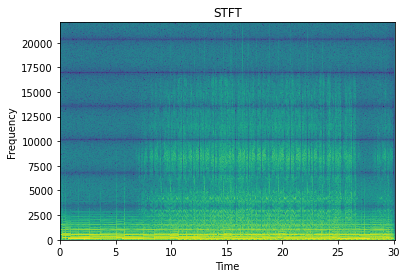

In [5]:
hn1 = averagingImpulse(13, 'Highpass')
filt = FIR_Filter(x, hn1, True, fs)
Audio(filt, rate=fs)

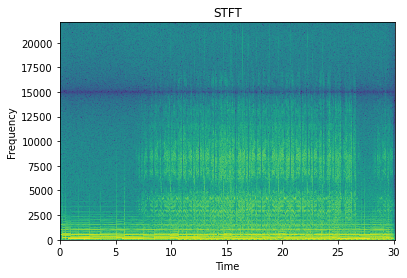

In [6]:
notch = nullFilter(x, 15000, fs)

/var/folders/b5/3l92j93d5t1__l78tfntmwyr0000gn/T/ipykernel_23723/2356623575.py:54: RuntimeWarning: invalid value encountered in divide
  hn = np.sin(omHat*centered)/(np.pi*centered)


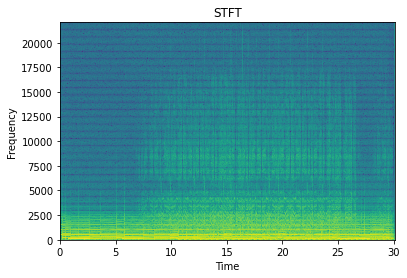

In [11]:
lopass = lowpassFilter(x, 2500, order=60, plot = True, fs = fs)

In [12]:
Audio(lopass, rate=fs)